# Interpretability

- https://shap.readthedocs.io/en/latest/

In [1]:
#!pip install shap
#!pip install matplotlib

In [2]:
import numpy as np
import pandas as pd

from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator
from sklearn.impute import SimpleImputer
from tpot.export_utils import set_param_recursive

import shap
import matplotlib as plt
from tpot import TPOTRegressor
import pickle

shap.initjs()
pd.options.display.max_columns = None

C:\Users\burno\AppData\Local\Programs\Python\Python38\lib\site-packages\tpot\builtins\__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


In [3]:
#import data
X1_train = pd.read_pickle("./X1_train.pkl")
y1_train = pd.read_pickle("./y1_train.pkl")
X2_train = pd.read_pickle("./X2_train.pkl")  
y2_train = pd.read_pickle("./y2_train.pkl")
X1_test = pd.read_pickle("./X1_val.pkl")
y1_test = pd.read_pickle("./y1_val.pkl")
X2_test = pd.read_pickle("./X2_val.pkl")  
y2_test = pd.read_pickle("./y2_val.pkl")

df_legend = pd.read_excel('df_project2.xlsx', sheet_name = 'data_dictionary') # load the data dictionary

## Model X1

In [4]:
#import tpot model
with open("./tpot_model_X1.pickle", "rb") as f:
    tpot_args = pickle.load(f)

tpot_x1 = TPOTRegressor(template=tpot_args["template"])
tpot_args["fitted_pipeline_"] = tpot_args["template"]
del tpot_args["template"]
for k, v in tpot_args.items():
    setattr(tpot_x1, k, v)

In [5]:
tpot_x1.fitted_pipeline_

Pipeline(steps=[('robustscaler', RobustScaler()), ('zerocount-1', ZeroCount()),
                ('zerocount-2', ZeroCount()),
                ('stackingestimator',
                 StackingEstimator(estimator=RandomForestClassifier(max_features=0.15000000000000002,
                                                                    min_samples_leaf=7,
                                                                    min_samples_split=17,
                                                                    random_state=42))),
                ('extratreesclassifier',
                 ExtraTreesClassifier(bootstrap=True, max_features=0.55,
                                      min_samples_leaf=11, min_samples_split=11,
                                      random_state=42))])

In [6]:
#remove Nan's and add titles
imputer = SimpleImputer(strategy="median")
imputer.fit(X1_train)
X1_train_no_nan = imputer.transform(X1_train)
X1_train = pd.DataFrame(X1_train_no_nan, columns = X1_train.columns)

#subsampling for speed
X1_train_summary = shap.sample(X1_train, 30)
#X1_train_summary = shap.kmeans(X1_train, 3)

In [7]:
# explain machine learning model
#explainer_x1 = shap.KernelExplainer(tpot_x1.fitted_pipeline_.predict_proba, X1_train_summary)
#shap_values_x1 = explainer_x1.shap_values(X1_train)

#pickle.dump(explainer_x1, open('explainer_x1.sav', 'wb'))
#pickle.dump(shap_values_x1, open('shap_values_x1.sav', 'wb'))

explainer_x1 = pickle.load(open('explainer_x1.sav', 'rb'))
shap_values_x1 = pickle.load(open('shap_values_x1.sav', 'rb'))

In [8]:
existing_columns_x1 = X1_train.columns

numeric_cols_x1 = list(set(df_legend[df_legend['isnumeric']==1]['name_col']).intersection(existing_columns_x1))
yes_no_cols_x1 = list(set(df_legend[df_legend['no_yes_vars']==1]['name_col']).intersection(existing_columns_x1))
other_cols_x1 = list(set(df_legend[(df_legend['no_yes_vars']==0) & (df_legend['isnumeric']==0)]['name_col']).intersection(existing_columns_x1))

# add dummy columns that are missing from previous lists
#missing_cols_x1 = set(existing_columns_x1).difference(numeric_cols).difference(yes_no_cols).difference(other_cols)

### Global

#### Feature Importances

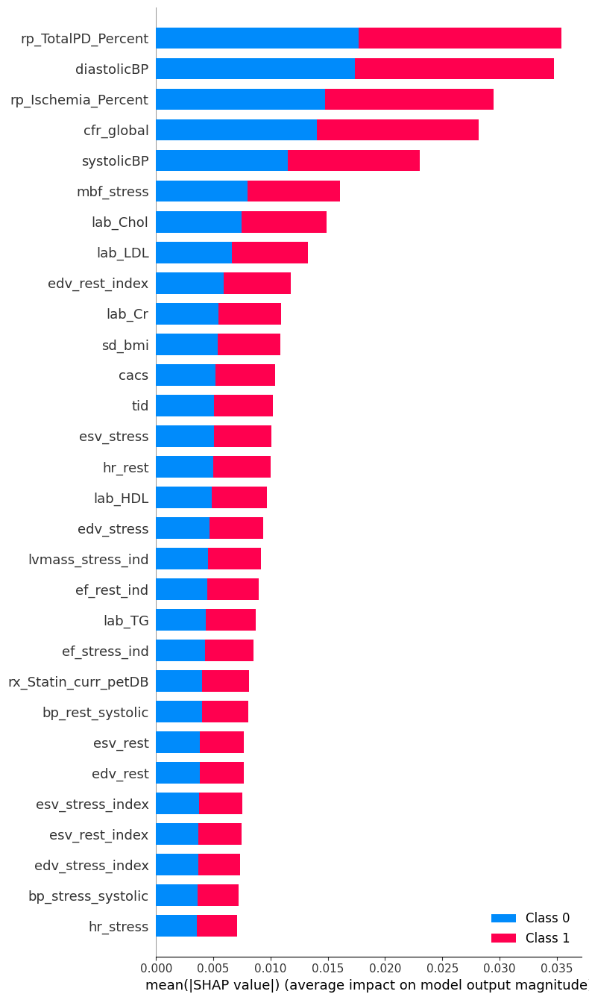

In [9]:
shap.summary_plot(shap_values_x1, X1_train, plot_type="bar", max_display = 30)

#### SHAP Summary Plot

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


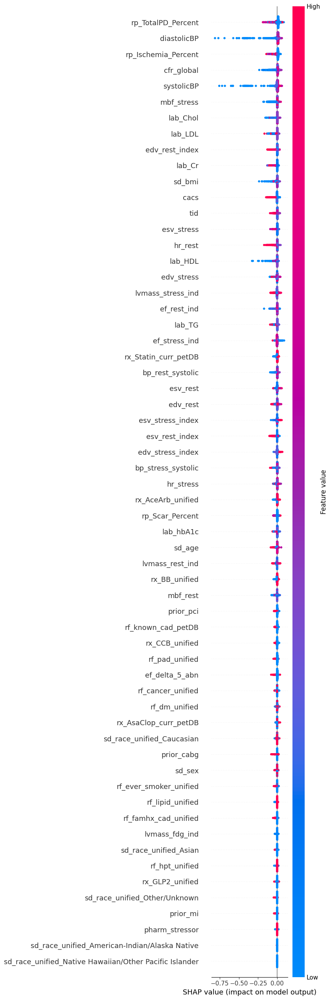

In [10]:
shap.summary_plot(shap_values_x1[0], X1_train, max_display = 100)

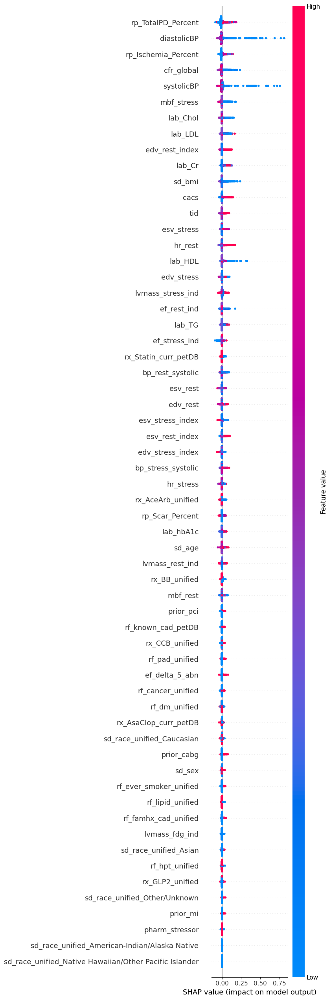

In [11]:
shap.summary_plot(shap_values_x1[1], X1_train, max_display = 100)

### Local

In [12]:
# mace predicted as 1
results_x1 = tpot_x1.fitted_pipeline_.predict(X1_train.to_numpy())
np.where(results_x1 == 1)

(array([   4,   10,   27,   40,   49,   59,   76,   96,  100,  103,  148,
         166,  168,  175,  191,  194,  209,  259,  261,  273,  277,  284,
         308,  332,  333,  346,  381,  390,  393,  395,  411,  413,  416,
         424,  436,  457,  458,  470,  488,  494,  498,  511,  520,  557,
         569,  607,  631,  643,  670,  677,  694,  746,  784,  795,  802,
         805,  808,  836,  842,  859,  862,  867,  882,  910,  912,  926,
         942,  966,  968,  969,  984,  986,  996, 1001, 1006, 1025, 1046,
        1052, 1056, 1060, 1069, 1084, 1090, 1096, 1097, 1098, 1103, 1108,
        1110, 1135, 1203, 1215, 1221, 1233, 1240, 1246, 1253, 1255, 1259,
        1264, 1305, 1342, 1379, 1381, 1390, 1392, 1398, 1409, 1422, 1430,
        1478, 1498, 1501, 1512, 1527, 1529, 1546, 1585, 1595, 1606, 1622,
        1624, 1638, 1639, 1644, 1665, 1697, 1736, 1738, 1745, 1758, 1762,
        1767, 1770, 1781, 1783, 1805, 1822, 1828, 1843, 1867, 1875, 1880,
        1885, 1890, 1891, 1895, 1906, 

In [13]:
# actual values as 1
np.where(y1_train == 1)

(array([  10,   27,   40,   49,   59,   76,  100,  103,  148,  159,  166,
         175,  191,  194,  209,  243,  249,  259,  261,  273,  277,  284,
         288,  308,  325,  332,  333,  346,  381,  390,  393,  395,  413,
         416,  436,  457,  458,  470,  488,  494,  498,  511,  536,  554,
         557,  560,  569,  607,  631,  643,  670,  672,  677,  694,  746,
         784,  793,  795,  802,  805,  808,  836,  842,  859,  862,  867,
         882,  910,  912,  926,  942,  966,  969,  984,  986,  996, 1001,
        1006, 1025, 1046, 1052, 1056, 1060, 1069, 1084, 1090, 1096, 1098,
        1103, 1108, 1110, 1135, 1154, 1215, 1221, 1233, 1240, 1246, 1253,
        1255, 1259, 1264, 1305, 1342, 1346, 1379, 1381, 1409, 1430, 1478,
        1498, 1501, 1512, 1527, 1529, 1546, 1585, 1595, 1606, 1622, 1624,
        1638, 1639, 1644, 1665, 1683, 1697, 1736, 1738, 1745, 1755, 1758,
        1762, 1767, 1770, 1781, 1783, 1805, 1822, 1828, 1843, 1867, 1875,
        1880, 1885, 1890, 1891, 1895, 

In [14]:
# predicting when mace = 1
shap.initjs()
shap.force_plot(explainer_x1.expected_value[1], shap_values_x1[1][40,:], X1_train.iloc[40,:]) # using index x

In [15]:
# predicting when mace=0
shap.initjs()
shap.force_plot(explainer_x1.expected_value[0], shap_values_x1[0][2,:],  X1_train.iloc[2,:]) # using index x

In [16]:
shap.initjs()
shap.force_plot(explainer_x1.expected_value[0], shap_values_x1[0][:1000,:],  X1_train.iloc[:1000,:])

In [17]:
shap.initjs()
shap.force_plot(explainer_x1.expected_value[1], shap_values_x1[1][:1000,:],  X1_train.iloc[:1000,:])

### Group

In [18]:
df_results_x1 = pd.DataFrame(results_x1, columns = target.columns)
df_testing_x1 = pd.DataFrame(testing_features_x1, columns = X1.columns)

NameError: name 'target' is not defined

In [ ]:
# combine results with features
combined = pd.concat([df_testing_x1, df_results_x1], axis=1)

In [ ]:
# filter data takes in user given filters
# The expected input is a matrix where each array is a key, value pair
# Example of expected input [['sd_sex', 0],['sd_race_unified_Caucasian',1]]

def filterData(data, filters):
    filtered_data = data.copy()
    for filter_pair in filters:
        key, value = filter_pair
        filtered_data = filtered_data.loc[filtered_data[key] == value]
    
    return filtered_data
    
def getMaceArrays(data, filters):
    filtered = filterData(combined, test_filters)

    mace0 = filtered[filtered['o_mace'] == 0]
    mace0 = mace0.drop('o_mace', axis = 1)
    mace1 = filtered[filtered['o_mace'] == 1]
    mace1 = mace1.drop('o_mace', axis = 1)
    return [mace0, mace1]

def getAggregatedData(data, numeric_cols, yes_no_cols, other_cols):
    mace_median = data[numeric_cols].median()
    mace_mode = data[yes_no_cols + other_cols].mode()
    merged = pd.DataFrame(mace_median).T.merge(mace_mode)
    
    return merged

def createForcePlot(pipeline, data, title):
    shap.initjs()
    explainer = shap.TreeExplainer(pipeline['randomforestclassifier'])
    shap_values = explainer.shap_values(data.to_numpy())
    if title == 'Mace 0':
        print(title)
        display(shap.force_plot(explainer.expected_value[0], shap_values[0], data))
    elif title == 'Mace 1':
        print(title)
        display(shap.force_plot(explainer.expected_value[1], shap_values[1], data))


In [ ]:
# select filters
#test_filters = [['sd_sex', 0], ['sd_race_unified_Caucasian',1]]

# 2 datasets: mace=0, mace=1
#mace0, mace1 = getMaceArrays(combined, test_filters)

In [ ]:
# select filters
test_filters = [['sd_age', 66]]

# 2 datasets: mace=0, mace=1
mace0, mace1 = getMaceArrays(combined, test_filters)

In [ ]:
# aggregate values for group level
mace_0_aggregated_x1 = getAggregatedData(mace0, numeric_cols_x1, yes_no_cols_x1, other_cols_x1)
mace_1_aggregated_x1 = getAggregatedData(mace1, numeric_cols_x1, yes_no_cols_x1, other_cols_x1)

In [ ]:
# mace=0
createForcePlot(exported_pipeline_x1, mace_0_aggregated_x1, 'Mace 0')

In [ ]:
# mace=1
createForcePlot(exported_pipeline_x1, mace_1_aggregated_x1, 'Mace 1')

In [ ]:
from tkinter import *
from IPython.display import clear_output

window=Tk()
window.title('Group Interpretability')
window.geometry("700x300+10+10")
        
# Dropdown menu options
OPTIONS1 = X1.columns
        
columns_copy = list(X1.columns.copy())
columns_copy.insert(0, "none")
        
OPTIONS2 = columns_copy
        
#function to aggregate over the data based on the selections
def oki():
    global test_filters
    global mace0
    global mace1
    global mace_0_aggregated_x1
    global mace_1_aggregated_x1
    if clicked2.get() == "none":
        test_filters = [[clicked1.get(), float(t1.get())]]
    elif clicked3.get() == "none":
        test_filters = [[clicked1.get(), float(t1.get())], [clicked2.get(), float(t2.get())]]
    else:
        test_filters = [[clicked1.get(), float(t1.get())], [clicked2.get(), float(t2.get())], 
                        [clicked3.get(), float(t3.get())]]
                
    mace0, mace1 = getMaceArrays(combined, test_filters)
    mace_0_aggregated_x1 = getAggregatedData(mace0, numeric_cols_x1, yes_no_cols_x1, other_cols_x1)
    mace_1_aggregated_x1 = getAggregatedData(mace1, numeric_cols_x1, yes_no_cols_x1, other_cols_x1)
    label.config( text = test_filters )
    
    #remove this line if you want to keep all the outputs
    clear_output(wait=True)
    
    shap.initjs()
    explainer = shap.TreeExplainer(exported_pipeline_x1['randomforestclassifier'])
    
    shap_values = explainer.shap_values(mace_0_aggregated_x1.to_numpy())
    print(test_filters,"MACE 0")
    display(shap.force_plot(explainer.expected_value[0], shap_values[0], mace_0_aggregated_x1))
    
    shap_values = explainer.shap_values(mace_1_aggregated_x1.to_numpy())
    print(test_filters,"MACE 1")
    display(shap.force_plot(explainer.expected_value[1], shap_values[1], mace_1_aggregated_x1))
    
# datatype of menu text
clicked1 = StringVar(window)
clicked2 = StringVar(window)
clicked3 = StringVar(window)

# initial menu text
clicked1.set(OPTIONS1[0])
clicked2.set(OPTIONS2[0])
clicked3.set(OPTIONS2[0])

# Create Dropdown menues
drop1 = OptionMenu( window , clicked1 , *OPTIONS1 )
drop1.pack()
drop1.place(x=100, y=50)
drop2 = OptionMenu( window , clicked2 , *OPTIONS2 )
drop2.pack()
drop2.place(x=100, y=100)
drop3 = OptionMenu( window , clicked3 , *OPTIONS2 )
drop3.pack()
drop3.place(x=100, y=150)
        
#Create OK button
button = Button(window, text="OK", command=oki)
button.pack()
button.place(x=150, y=200)
        
#Create exit button
exit_button = Button(window, text="Exit", command=window.destroy)
exit_button.pack(pady=20)
exit_button.place(x=500, y=200)
        
#Create label info window
label = Label( window , text = " " )
label.pack()
        
#Create entry box windows for values
t1=Entry()
t2=Entry()
t3=Entry()
t1.place(x=500, y=50)
t2.place(x=500, y=100)
t3.place(x=500, y=150)

window.mainloop()

## Model X2

In [ ]:
# model X2

# NOTE: Make sure that the outcome column is labeled 'target' in the data file
tpot_data_x2 = pd.read_csv('X2.csv', dtype=np.float64)
target = pd.read_csv('target.csv')

training_features_x2, testing_features_x2, training_target_x2, testing_target_x2 = \
            train_test_split(tpot_data_x2, target, random_state=42)

imputer = SimpleImputer(strategy="median")
imputer.fit(training_features_x2)
training_features_x2 = imputer.transform(training_features_x2)
testing_features_x2 = imputer.transform(testing_features_x2)

# Average CV score on the training set was: 0.9126299473614102
exported_pipeline_x2 = make_pipeline(
    StackingEstimator(estimator=RandomForestClassifier(bootstrap=True, criterion="gini", max_features=0.7000000000000001, 
                                                       min_samples_leaf=8, min_samples_split=4, n_estimators=100)),
    StackingEstimator(estimator=GradientBoostingClassifier(learning_rate=0.01, max_depth=6, max_features=0.4, 
                                                           min_samples_leaf=6, min_samples_split=14, n_estimators=100, 
                                                           subsample=1.0)),
    RandomForestClassifier(bootstrap=False, criterion="gini", max_features=0.8, min_samples_leaf=16, min_samples_split=16, 
                           n_estimators=100)
)

# Fix random state for all the steps in exported pipeline
set_param_recursive(exported_pipeline_x2.steps, 'random_state', 42)

exported_pipeline_x2.fit(training_features_x2, training_target_x2)
results_x2 = exported_pipeline_x2.predict(testing_features_x2)

In [ ]:
#explainer_x2 = shap.TreeExplainer(exported_pipeline_x2['randomforestclassifier'])
#shap_values_x2 = explainer_x2.shap_values(testing_features_x2)

#pd.DataFrame(shap_values_x2[0]).head()

In [ ]:
# add labels
#df_testing_x2 = pd.DataFrame(testing_features_x2, columns = X2.columns)

### Global

#### Feature Importances

#### SHAP Summary Plot

### Local

### Group